### 연기(Smoke) 탐지 모델

#### 데이터셋 다운로드
- 연기 데이터셋: https://public.roboflow.com/object-detection/wildfire-smoke/

In [1]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 13673, done.
remote: Total 13673 (delta 0), reused 0 (delta 0), pack-reused 13673
Receiving objects: 100% (13673/13673), 12.16 MiB | 34.39 MiB/s, done.
Resolving deltas: 100% (9559/9559), done.


In [2]:
%cd /content/yolov5/
!pip install -qr requirements.txt

/content/yolov5
     |████████████████████████████████| 596 kB 24.0 MB/s 


In [3]:
%mkdir /content/yolov5/smoke
%cd /content/yolov5/smoke
!curl -L "https://public.roboflow.com/ds/7TkolK0bXf?key=z4LFrPRbZq" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content/yolov5/smoke
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1836      0 --:--:-- --:--:-- --:--:--  1836
100 27.6M  100 27.6M    0     0  26.0M      0  0:00:01  0:00:01 --:--:-- 75.0M
Archive:  roboflow.zip
 extracting: test/images/ck0rqdyeq4kxa08633xv2wqe1_jpeg.rf.30df6babe258cdc1d5a4e042262665e4.jpg  
 extracting: test/images/ck0qd918zic840701hnezgpgy_jpeg.rf.30de65aa3639b8a113db71a11bc2726c.jpg  
 extracting: test/images/ck0kfjen48qhj0701wjkosmel_jpeg.rf.49b365cc7135deee1332e6657401abc5.jpg  
 extracting: test/images/ck0t7cczuqxtt07212nj5eznh_jpeg.rf.1a9299c8658d89f6271dba2aeefe074d.jpg  
 extracting: test/images/ck0kn8y5y9y3507018k5p06ma_jpeg.rf.466b2fb63a73c0138cf75b3ddc71d490.jpg  
 extracting: test/images/ck0tzjni6sjt50863e6a6a8fl_jpeg.rf.46d343d22cd08c90668cc0d50bc52a2d.jpg  
 extracting: test/images/ck0tszlepw02k0721zr71djfj_

In [4]:
%cd ../..

/content


In [5]:
from glob import glob

train_image_list = glob("yolov5/smoke/train/images/*.jpg")
test_image_list = glob("yolov5/smoke/test/images/*.jpg")
valid_image_list = glob("yolov5/smoke/valid/images/*.jpg")

print(len(train_image_list), len(test_image_list), len(valid_image_list))

516 74 147


In [6]:
import yaml

with open("yolov5/smoke/train.txt", "w") as f:
    f.write("\n".join(train_image_list) + "\n")

with open("yolov5/smoke/test.txt", "w") as f:
    f.write("\n".join(test_image_list) + "\n")

with open("yolov5/smoke/valid.txt", "w") as f:
    f.write("\n".join(valid_image_list) + "\n")

In [7]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def write_template(line, cell):
    with open(line, "w") as f:
        f.write(cell.format(**globals()))

In [8]:
%cat yolov5/smoke/data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['smoke']

In [9]:
%%write_template yolov5/smoke/data.yaml

train: ./smoke/train/images
test: ./smoke/test/images
val: ./smoke/valid/images

nc: 1
names: ['smoke']

In [10]:
%cat yolov5/smoke/data.yaml


train: ./smoke/train/images
test: ./smoke/test/images
val: ./smoke/valid/images

nc: 1
names: ['smoke']

#### 모델 구성

In [11]:
import yaml

with open("yolov5/smoke/data.yaml", "r") as stream:
    num_classes = str(yaml.safe_load(stream)["nc"])

%cat yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [12]:
%%write_template yolov5/models/custom_yolov5.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [14]:
%cat yolov5/models/custom_yolov5.yaml


# Parameters
nc: 1  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

#### 학습(Training)
- img: 입력 이미지 크기 정의
- batch: 배치 크기 정의
- epochs: 학습 횟수 정의
- data: yaml 파일 경로
- cfg: 모델 구성 지정
- weights: 가중치에 대한 경로 지정
- name: 결과 이름
- nosave: 최종 체크포인트만 저장
- cache: 빠른 학습을 위한 이미지 캐시

In [15]:
%time
%cd /content/yolov5
!python train.py --img 640 --batch 8 --epochs 200 --data smoke/data.yaml --cfg models/custom_yolov5.yaml --weights "" --name smoke_results --cache 

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.96 µs
/content/yolov5
train: weights=, cfg=models/custom_yolov5.yaml, data=smoke/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=smoke_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-208-g15057d2 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=

In [16]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [17]:
!ls /content/yolov5/runs/train/smoke_results

confusion_matrix.png				   results.png
events.out.tfevents.1653191111.cf540cc8c0ff.184.0  train_batch0.jpg
F1_curve.png					   train_batch1.jpg
hyp.yaml					   train_batch2.jpg
labels_correlogram.jpg				   val_batch0_labels.jpg
labels.jpg					   val_batch0_pred.jpg
opt.yaml					   val_batch1_labels.jpg
P_curve.png					   val_batch1_pred.jpg
PR_curve.png					   val_batch2_labels.jpg
R_curve.png					   val_batch2_pred.jpg
results.csv					   weights


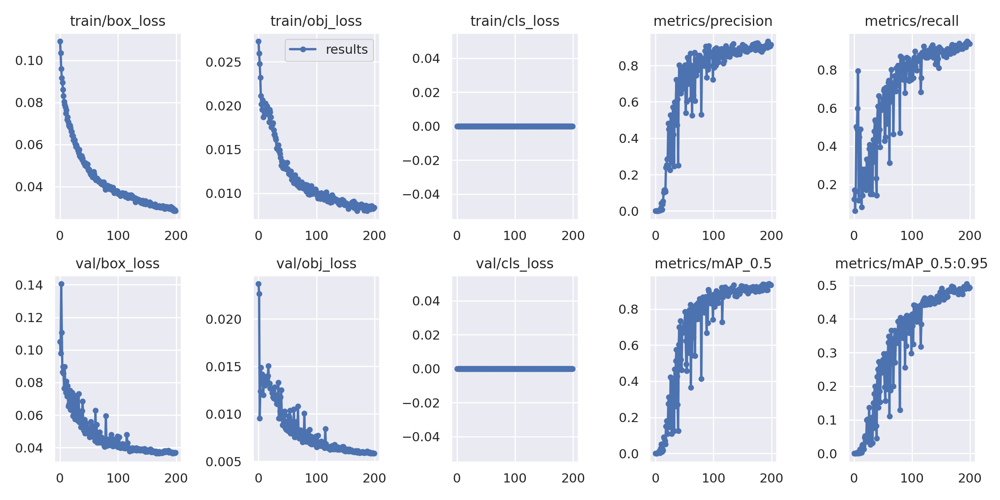

In [18]:
from IPython.display import Image

Image(filename="runs/train/smoke_results/results.png", width=800)

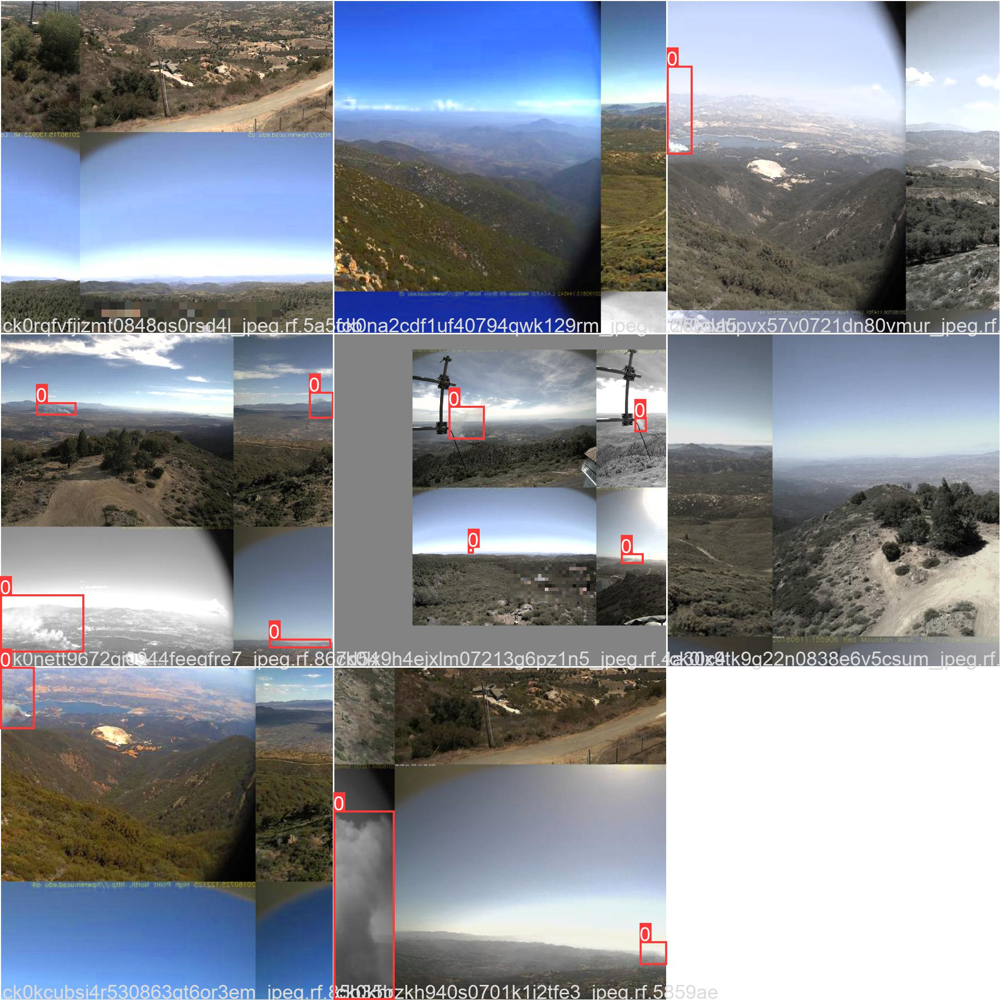

In [19]:
Image(filename="runs/train/smoke_results/train_batch0.jpg", width=800)

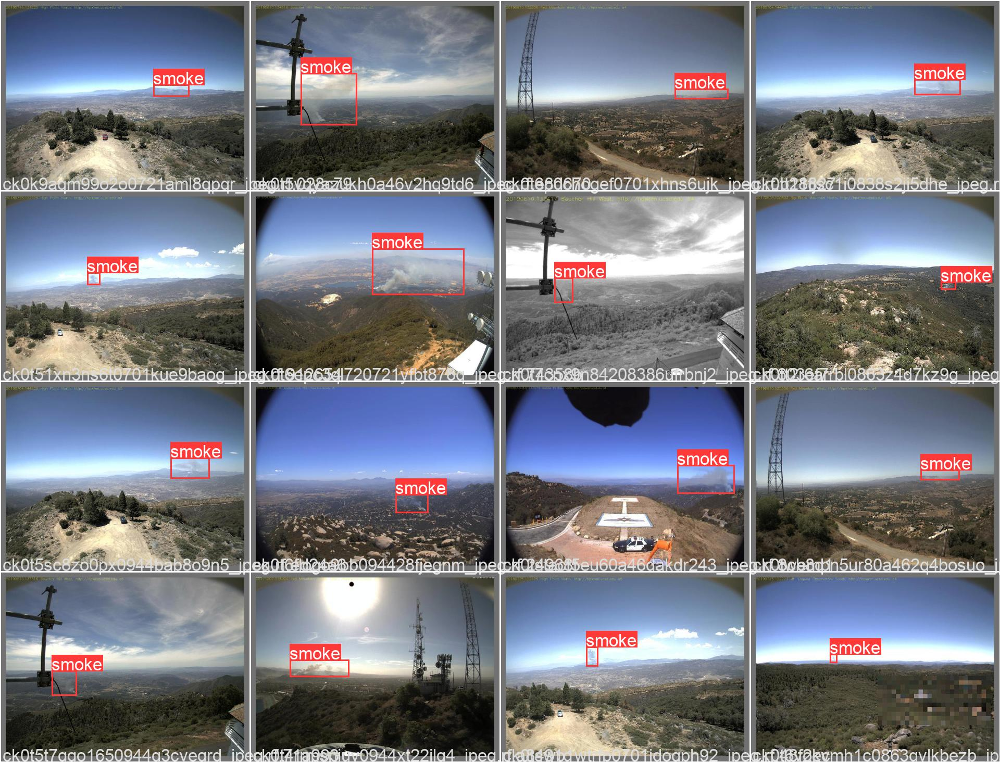

In [20]:
Image(filename="runs/train/smoke_results/val_batch0_labels.jpg", width=800)

#### 검증(Validation)

In [21]:
!python val.py --weights runs/train/smoke_results/weights/best.pt --data smoke/data.yaml --img 640 --iou 0.65 --half

val: data=smoke/data.yaml, weights=['runs/train/smoke_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v6.1-208-g15057d2 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5 summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning '/content/yolov5/smoke/valid/labels.cache' images and labels... 147 found, 0 missing, 0 empty, 0 corrupt: 100% 147/147 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 5/5 [00:03<00:00,  1.28it/s]
                 all        147        147      0.932      0.932      0.936      0.508
Speed: 0.1ms pre-process, 3.8ms inference, 1.8ms NMS per image at shape (32, 3, 640, 640)
Results sav

In [23]:
!python val.py --weights runs/train/smoke_results/weights/best.pt --data smoke/data.yaml --img 640 --task test

val: data=smoke/data.yaml, weights=['runs/train/smoke_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-208-g15057d2 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5 summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning '/content/yolov5/smoke/test/labels' images and labels...74 found, 0 missing, 0 empty, 0 corrupt: 100% 74/74 [00:00<00:00, 440.85it/s]
test: New cache created: /content/yolov5/smoke/test/labels.cache
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 3/3 [00:02<00:00,  1.27it/s]
                 all         74         74       0.86      0.834      0.913      0.543
Speed: 0.2ms pre-process, 6.8ms infe

#### 추론(Inference)

In [22]:
!ls runs/train/smoke_results/weights

best.pt  last.pt


In [24]:
!python detect.py --weights runs/train/smoke_results/weights/best.pt --img 640 --conf 0.4 --source smoke/test/images

detect: weights=['runs/train/smoke_results/weights/best.pt'], source=smoke/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-208-g15057d2 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5 summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/74 /content/yolov5/smoke/test/images/ck0kcoc8ik6ni0848clxs0vif_jpeg.rf.8b4629777ffe1d349cc970ee8af59eac.jpg: 480x640 1 smoke, Done. (0.017s)
image 2/74 /content/yolov5/smoke/test/images/ck0kd4afx8g470701watkwxut_jpeg.rf.bb5a1f2c2b04be20c948fd3c5cec33ff.jpg: 480x640 1 smoke, Done. (0.011s)
image 3/74 /content/yolov5/smoke/test/images/ck

runs/detect/exp/ck0ovkzw8secm0863zxuv11su_jpeg.rf.9a01b3c931df829098903cb86c986a6e.jpg


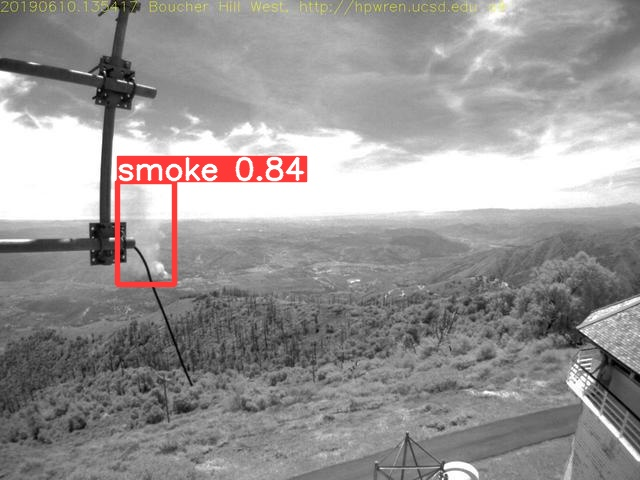

runs/detect/exp/ck0txsbnlsx040838wocuy68k_jpeg.rf.c2fc10e141acf05a539ae23d0c18aca1.jpg


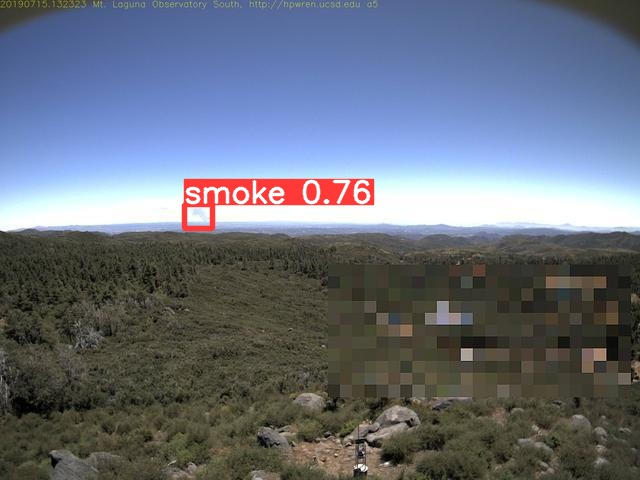

runs/detect/exp/ck0l9uumy9b4i0863izsuks74_jpeg.rf.688da3ca009efc20f792d1aa922f3131.jpg


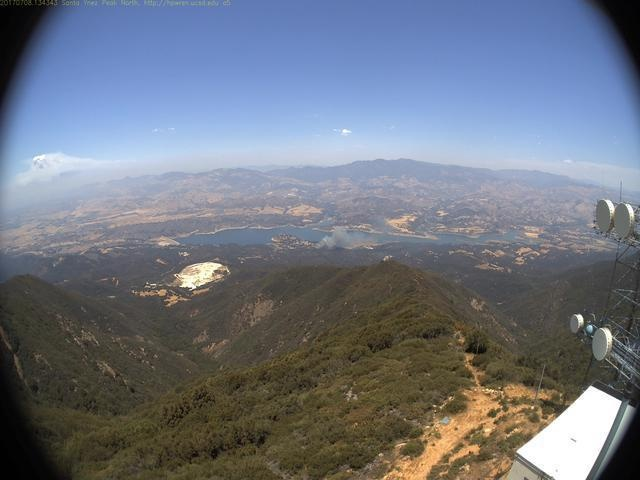

runs/detect/exp/ck0kewsaha6hh07215jgx1bp2_jpeg.rf.1a375d20560d0de016bb524921f7b2a9.jpg


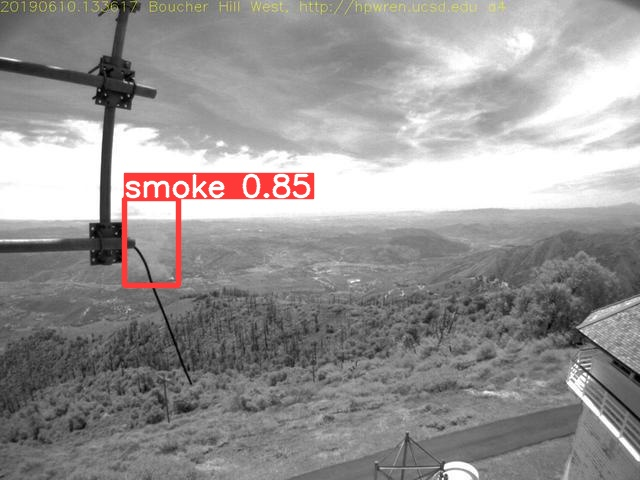

runs/detect/exp/ck0kmftzekfwv0a46aj0nh5dz_jpeg.rf.a9f20064706442166518aaa4f5274d5a.jpg


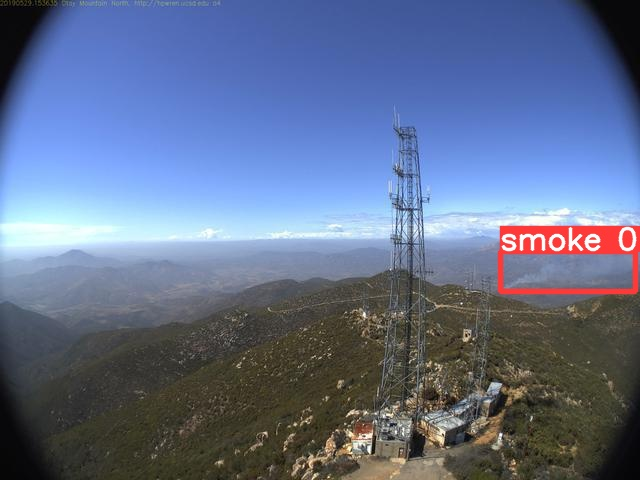

runs/detect/exp/ck0t421swni18070115tymsht_jpeg.rf.65fa44d722ea0176af1238e3de09e129.jpg


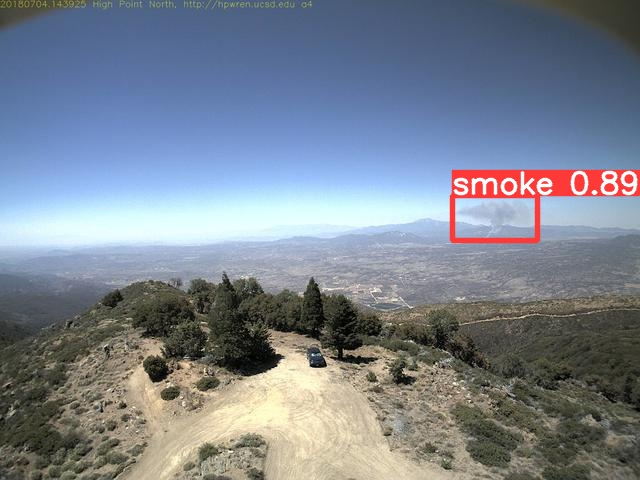

runs/detect/exp/ck0kmfd7ibcib0721v08q1jv0_jpeg.rf.8965bf83aff0df8ea94290a16227d8c9.jpg


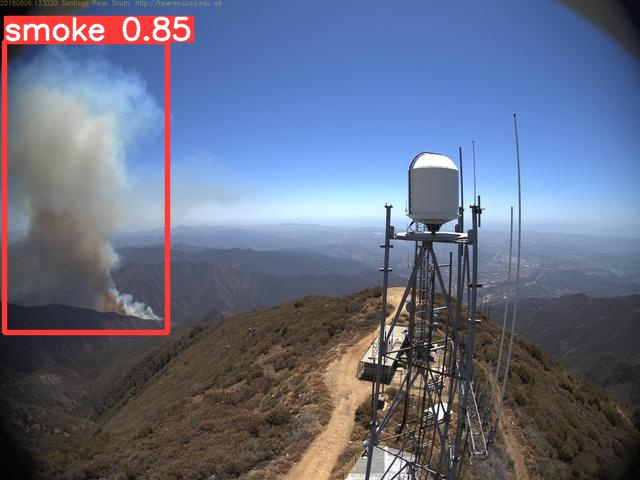

runs/detect/exp/ck0ty797gwmyd0721weeb3b90_jpeg.rf.9430b12a32c87425c3aac1afa654086a.jpg


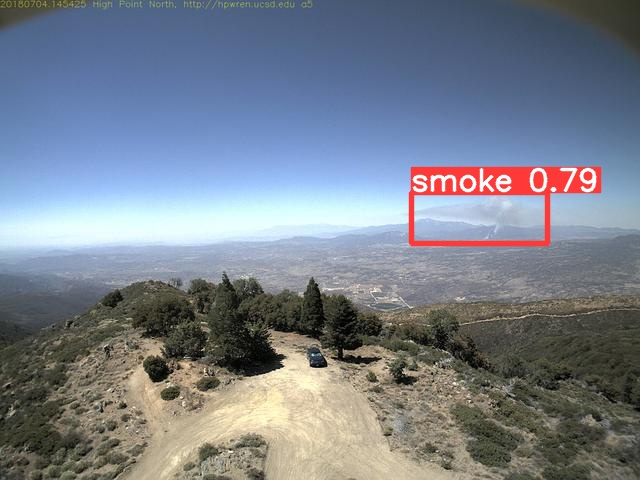

runs/detect/exp/ck0kfhu4n8q7f0701ixmonyig_jpeg.rf.a3cc5282520b3bac90718bdd5528bd76.jpg


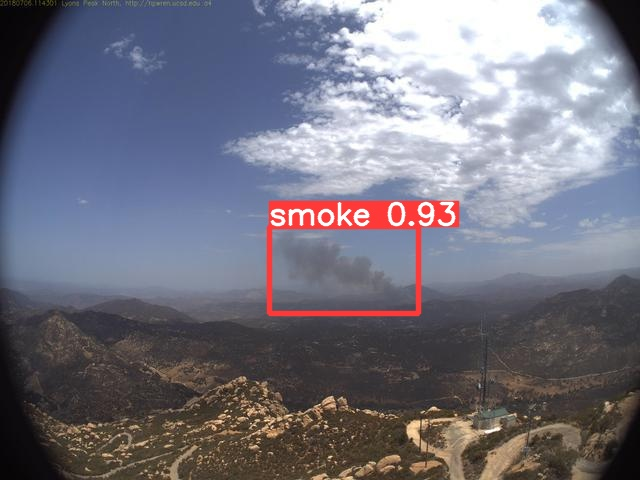

runs/detect/exp/ck0nd5l7girkp0848rd5cwpcq_jpeg.rf.3f8e309fbb0b728a8803d20bc601612a.jpg


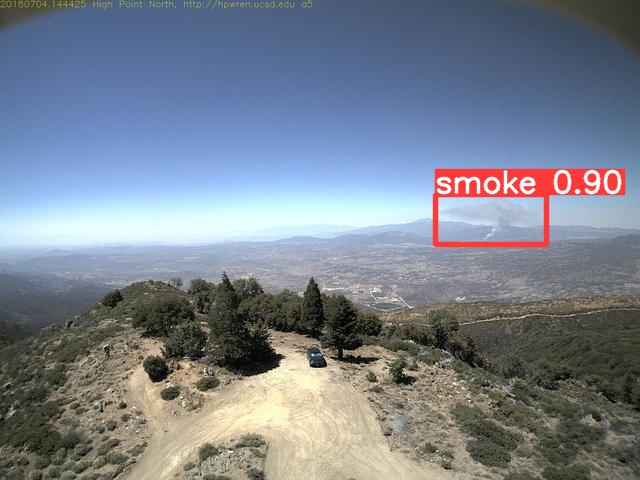

In [40]:
import glob
import random
from IPython.display import Image, display

images = ["path"]
for i in range(10):
  image_name = random.choice(glob.glob("runs/detect/exp/*.jpg"))
  print(image_name)
  if image_name in images:
    while True:
      image_name = random.choice(glob.glob("runs/detect/exp/*.jpg"))
      if image_name not in images:
        break
  images.append(image_name)
  display(Image(filename=image_name))

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
